In [1]:
!pip install tensorflow
!pip install imgaug
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

C:\Users\Dhairya Hindoriya\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
datadir = 'Data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

C:\conda_tmp\ipykernel_6736\178280031.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\center_2024_01_09_11_40_00_385.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\left_2024_01_09_11_40_00_385.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\right_2024_01_09_11_40_00_385.jpg,0.0,0.0,0.0,0.000023
1,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\center_2024_01_09_11_40_00_580.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\left_2024_01_09_11_40_00_580.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\right_2024_01_09_11_40_00_580.jpg,0.0,0.0,0.0,0.000022
2,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\center_2024_01_09_11_40_00_718.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\left_2024_01_09_11_40_00_718.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\right_2024_01_09_11_40_00_718.jpg,0.0,0.0,0.0,0.000022
3,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\center_2024_01_09_11_40_00_906.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\left_2024_01_09_11_40_00_906.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\right_2024_01_09_11_40_00_906.jpg,0.0,0.0,0.0,0.000024
4,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\center_2024_01_09_11_40_01_005.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\left_2024_01_09_11_40_01_005.jpg,C:\Users\Dhairya Hindoriya\Downloads\simulator-windows-64\Data\IMG\right_2024_01_09_11_40_01_005.jpg,0.0,0.0,0.0,0.000025


In [3]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()


,center,left,right,steering,throttle,reverse,speed
0,center_2024_01_09_11_40_00_385.jpg,left_2024_01_09_11_40_00_385.jpg,right_2024_01_09_11_40_00_385.jpg,0.0,0.0,0.0,0.000023
1,center_2024_01_09_11_40_00_580.jpg,left_2024_01_09_11_40_00_580.jpg,right_2024_01_09_11_40_00_580.jpg,0.0,0.0,0.0,0.000022
2,center_2024_01_09_11_40_00_718.jpg,left_2024_01_09_11_40_00_718.jpg,right_2024_01_09_11_40_00_718.jpg,0.0,0.0,0.0,0.000022
3,center_2024_01_09_11_40_00_906.jpg,left_2024_01_09_11_40_00_906.jpg,right_2024_01_09_11_40_00_906.jpg,0.0,0.0,0.0,0.000024
4,center_2024_01_09_11_40_01_005.jpg,left_2024_01_09_11_40_01_005.jpg,right_2024_01_09_11_40_01_005.jpg,0.0,0.0,0.0,0.000025


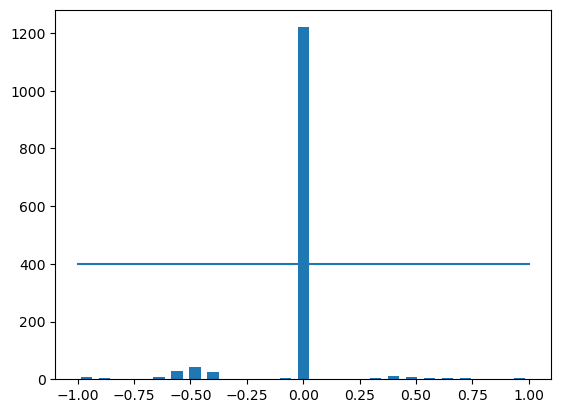

In [4]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [5]:
print('total data:', len(data))
print(data.shape)
     

total data: 1393
(1393, 7)


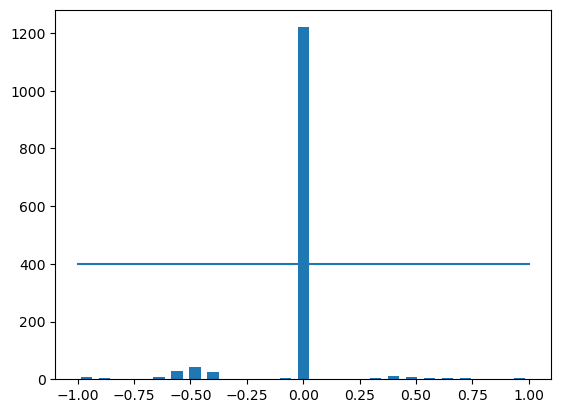

In [6]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [7]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [8]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [9]:
len(image_paths)

4179

In [10]:
len(steerings)

4179

In [11]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3343
Valid Samples: 836


Text(0.5, 1.0, 'Validation set')

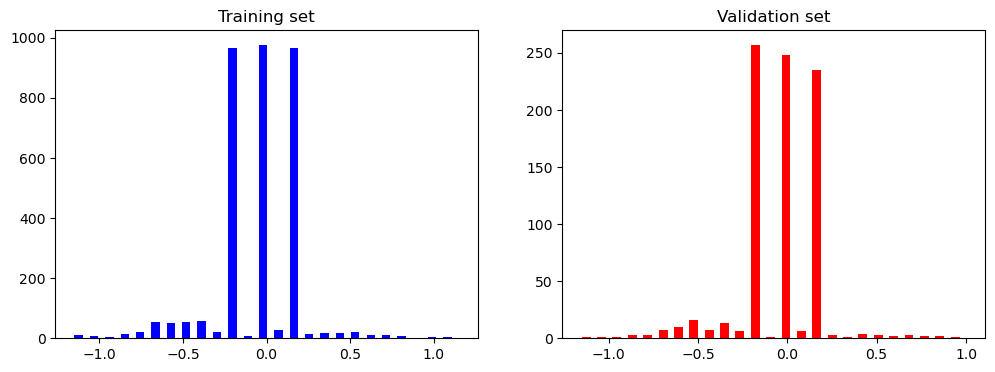

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

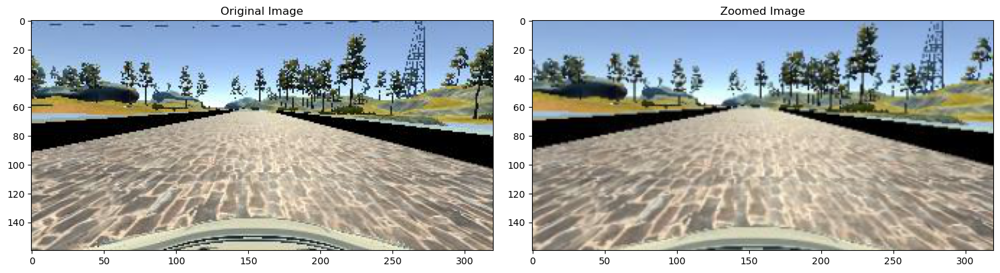

In [13]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

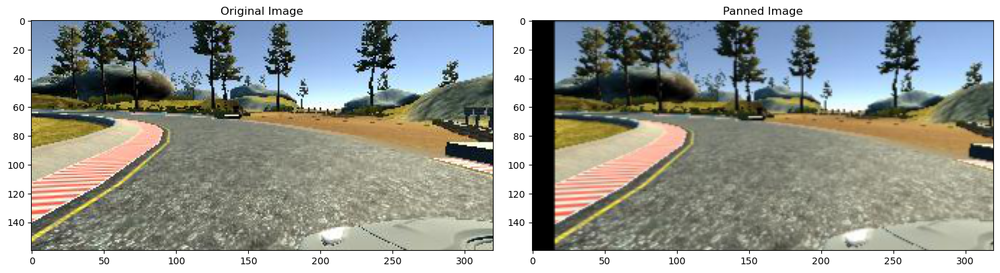

In [14]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')
     

Text(0.5, 1.0, 'Brightness altered image ')

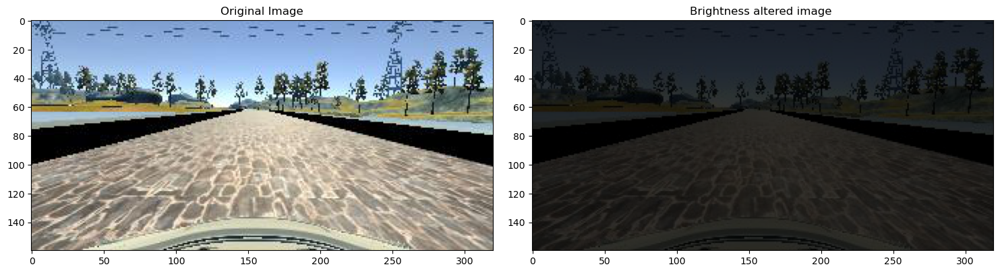

In [15]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.0')

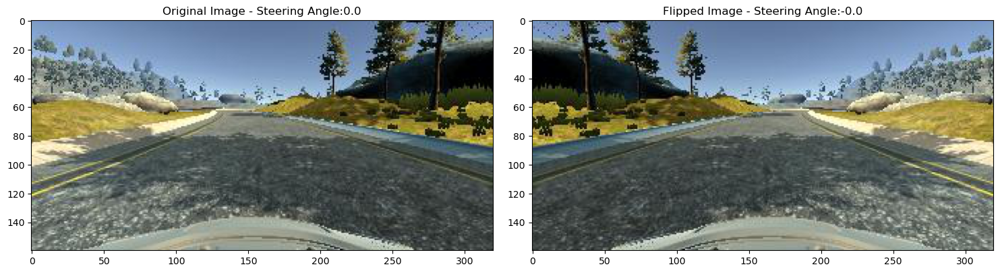

In [16]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [17]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle
     

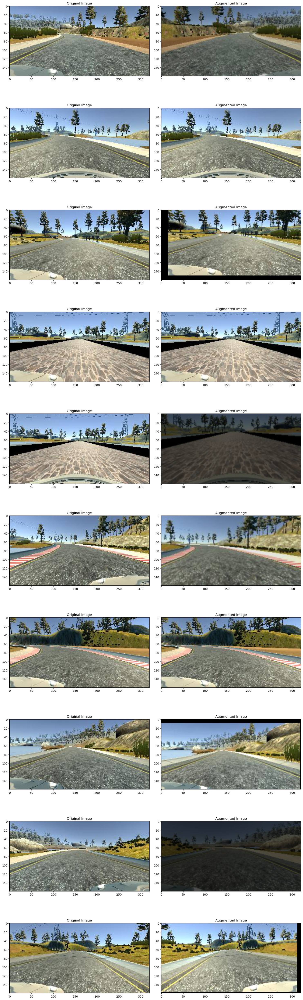

In [18]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")
     


In [19]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

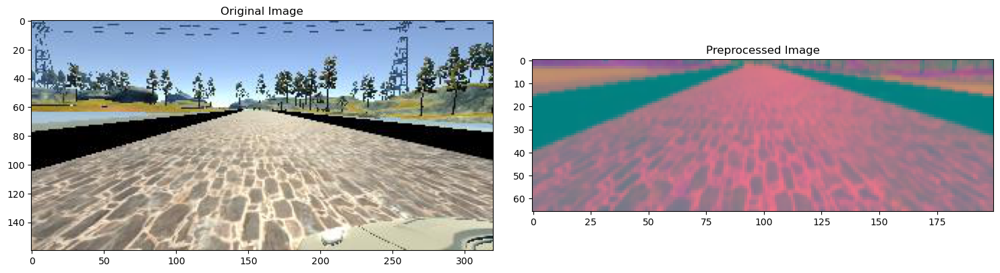

In [20]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [21]:
!nvidia-smi

Tue Jan  9 21:12:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.33                 Driver Version: 546.33       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce MX330         WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   50C    P8              N/A / ERR! |     30MiB /  2048MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [22]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [23]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

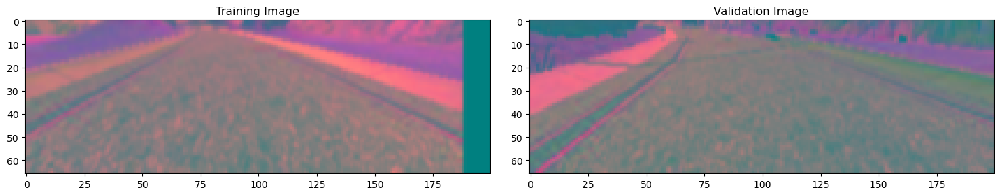

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [25]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                

In [26]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\conda_tmp\ipykernel_6736\2113613756.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10

300/300 [==============================] - 146s 481ms/step - loss: 0.0866 - val_loss: 0.0391
Epoch 2/10
300/300 [==============================] - 132s 443ms/step - loss: 0.0495 - val_loss: 0.0356
Epoch 3/10
300/300 [==============================] - 132s 442ms/step - loss: 0.0449 - val_loss: 0.0333
Epoch 4/10
300/300 [==============================] - 136s 455ms/step - loss: 0.0436 - val_loss: 0.0342
Epoch 5/10
300/300 [==============================] - 134s 447ms/step - loss: 0.0412 - val_loss: 0.0313
Epoch 6/10
300/300 [==============================] - 138s 463ms/step - loss: 0.0414 - val_loss: 0.0306
Epoch 7/10
300/300 [==============================] - 135s 451ms/step - loss: 0.0401 - val_loss: 0.0327
Epoch 8/10
300/300 [==============================] - 139s 464ms/step - loss: 0.0390 - val_loss: 0.0309
Epoch 9/10
300/300 [==============================] - 187s 625ms/step - loss: 0.0376 - val_loss: 0.0302
Epoch 10/10
300/300 [==============================] - 182s 609

Text(0.5, 0, 'Epoch')

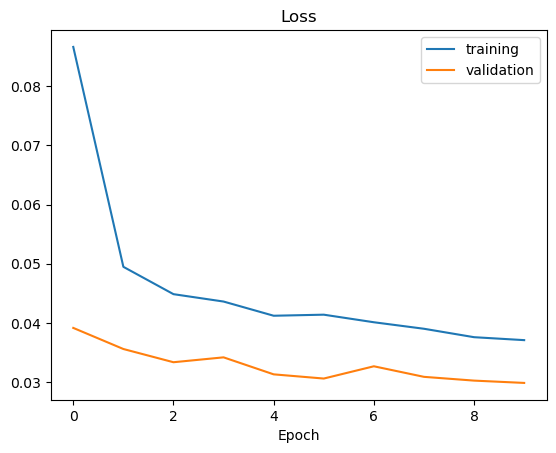

In [27]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [35]:
from tensorflow.keras.models import load_model
model.save('model.h5')
from IPython.display import FileLink
FileLink(r'model.h5')

C:\Users\Dhairya Hindoriya\Self Driving Car\model.h5